In [12]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
def plot_cosine_histogram(cosine_similarities, normalize=False, bins=50):
    """
    Display histogram of cosine similarities.
    
    Args:
        cosine_similarities (torch.Tensor or np.ndarray): Values between -1 and 1.
        normalize (bool): If True, normalize so total frequency sums to 1.0.
        bins (int): Number of histogram bins.
    """
    # Convert to 1D NumPy array
    if isinstance(cosine_similarities, torch.Tensor):
        vals = cosine_similarities.flatten().detach().cpu().numpy()
    else:
        vals = np.asarray(cosine_similarities).flatten()

    fig, ax = plt.subplots(figsize=(6,4))

    # Compute histogram manually for total-sum normalization
    counts, bin_edges = np.histogram(vals, bins=bins, range=(-1.0, 1.0))
    if normalize:
        counts = counts / counts.sum()

    # Plot
    ax.bar(
        (bin_edges[:-1] + bin_edges[1:]) / 2,
        counts,
        width=np.diff(bin_edges),
        edgecolor='black',
        alpha=0.75
    )

    # Labels and info
    ax.set_xlim(-1.0, 1.0)
    ax.set_xlabel('Cosine similarity')
    ax.set_ylabel('Normalized frequency (sum=1.0)' if normalize else 'Frequency')
    ax.set_title(f'N={len(vals)}  mean={np.mean(vals):.3f}  sd={np.std(vals):.3f}')
    ax.axvline(0.0, linestyle='--', color='gray')
    ax.axvline(np.mean(vals), linestyle=':', color='red')
    ax.grid(alpha=0.3)
    plt.show()

# Example usage:
# plot_cosine_histogram(cosine_similarities, normalize=True)


In [20]:
print(torch.cat(total_stats['norms_A']).mean().item(), torch.cat(total_stats['norms_A']).std().item())

print(torch.cat(total_stats['norms_B']).mean().item(), torch.cat(total_stats['norms_B']).std().item())


0.04482285678386688 0.0335548110306263
3.529877358232625e-05 3.263731559854932e-05


/tmp/ipykernel_4127048/4210988755.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  t = torch.load(path)


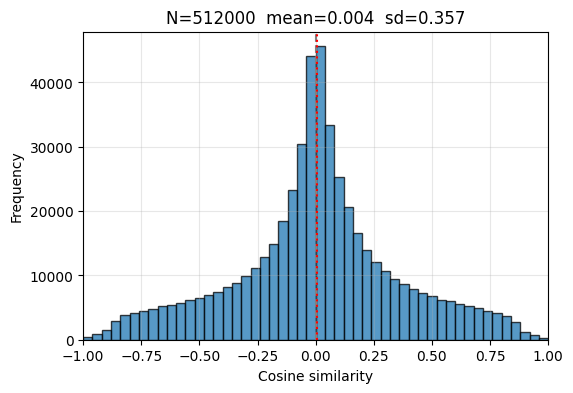

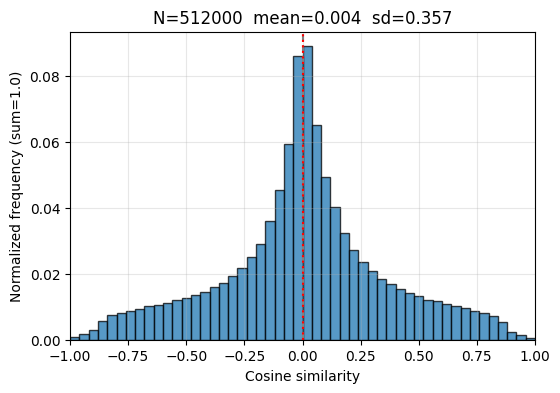

In [21]:

base_dir ="data_root/logs/esd/stats"

# exp_name = "esd-x.nG3.00_GP.gG.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
# exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.ganesha_sd1.4_r0"


total_stats = defaultdict(list)
steps = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500,550,600,650,700,750,800,850,900,950,1000]

for step in steps:
    path = f"{base_dir}/{exp_name}/step{step}_grad_stats_static.pt"
    t = torch.load(path)
    for k, v in t.items():
        if "gH" in exp_name and (k == "cosine_similarities" or k == "norms_A" or k == "norms_B"):
            v = [x.flatten() for x in v if x is not None]
        total_stats[k].extend(v)
cosine_similarities= torch.stack(total_stats['cosine_similarities'])
plot_cosine_histogram(cosine_similarities, bins=50)
plot_cosine_histogram(cosine_similarities, normalize=True, bins=50)

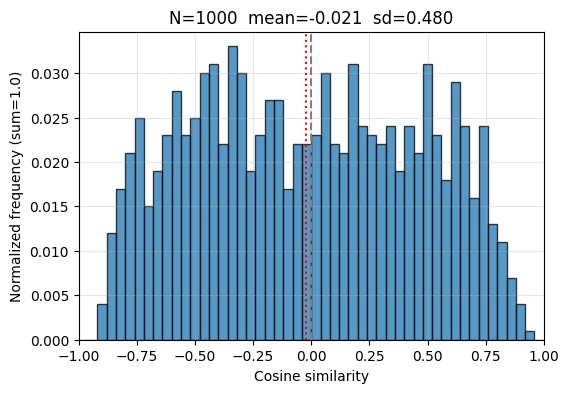

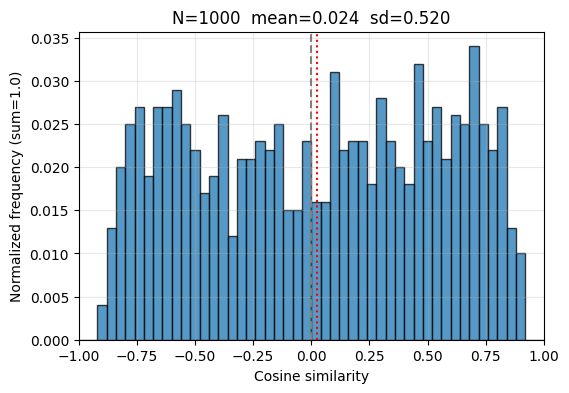

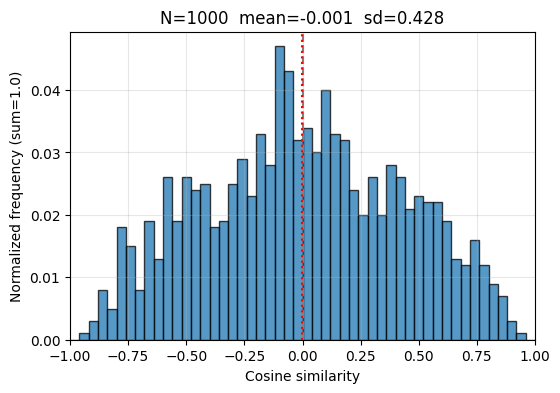

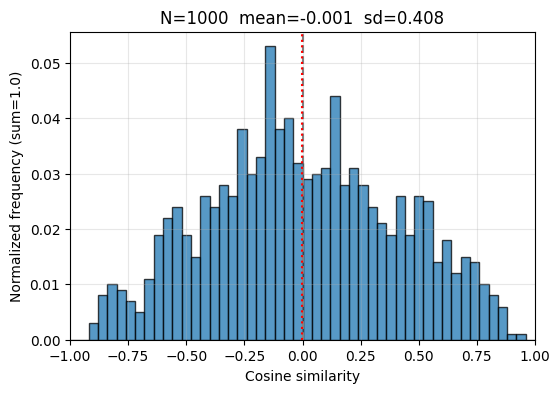

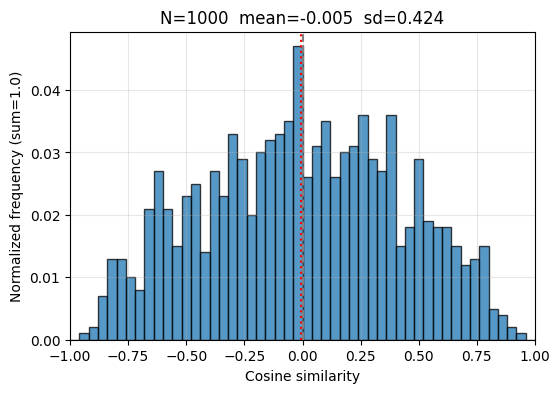

...

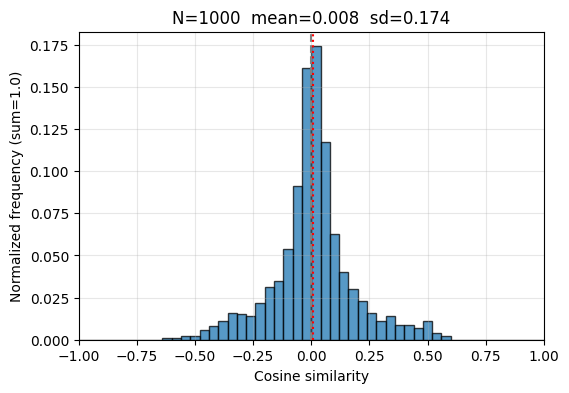

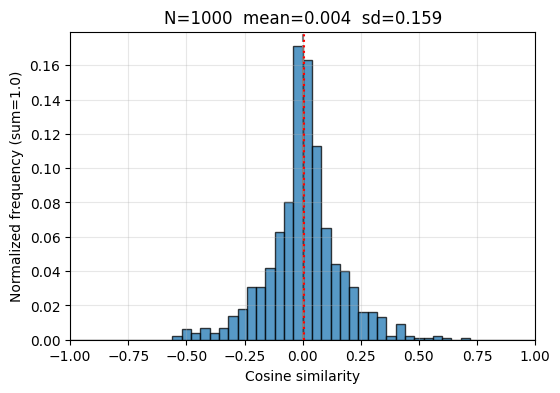

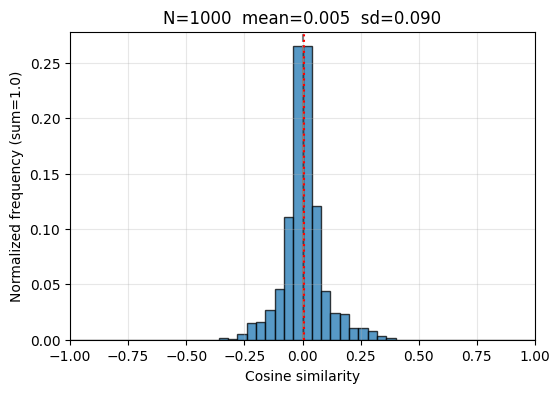

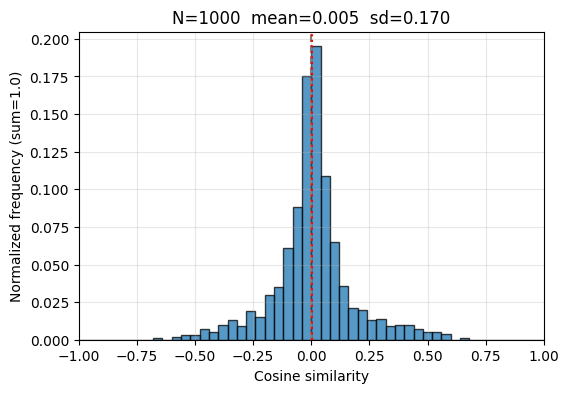

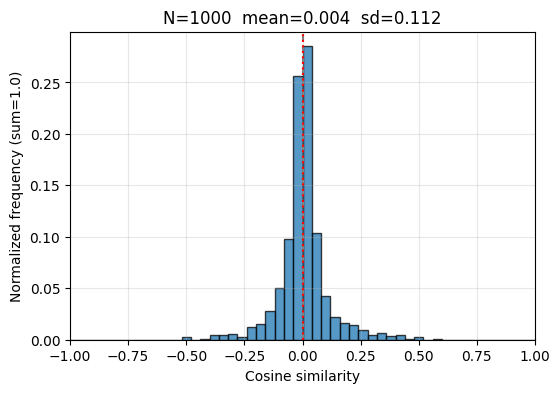

Total 0 / 512 heads have more than 500 negatives


In [23]:
neg_thresh = 0.0
n_head = 512

neg_head = 0
for i in range(n_head):
    n_neg = (cosine_similarities[:,i] < neg_thresh).sum().item()
    plot_cosine_histogram(cosine_similarities[:,i], normalize=True, bins=50)
    
    # if n_neg > 1000//2:
    #     print(f"Index {i} has {n_neg} / {cosine_similarities.shape[0]} < {neg_thresh}")
    #     plot_cosine_histogram(cosine_similarities[:,i], normalize=True, bins=50)
    #     neg_head += 1
print(f"Total {neg_head} / {n_head} heads have more than 500 negatives")

In [ ]:

base_dir ="data_root/logs/esd/stats"

# exp_name = "esd-x.nG3.00_GP.gG.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
# exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.ganesha_sd1.4_r0"


steps = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]

total_stats = defaultdict(list)

for step in steps:
    path = f"{base_dir}/{exp_name}/step{step}_grad_stats_static.pt"
    t = torch.load(path)

random_indices = np.random.randint(0, 512, size=30)


n_well_neg = 0
for idx in list(random_indices) + [464, 424, 455, 41 ,13, 106, 456, 15]:
    total_stats = defaultdict(list)
    for k, v in t.items():
        if "gH" in exp_name and k == "cosine_similarities" or k == "norms_A" or k == "norms_B":
            # v = [x.flatten() for x in v if x is not None]  # Filter out None values
            v = [x.flatten()[idx] for x in v if x is not None]
            
            well_neg_cos = [x for x in v if x < 0.25]
            
            if len(well_neg_cos) > int( 512 * 3/8):
                n_well_neg += 1
                total_stats[k].extend(v)
    cosine_similarities= torch.stack(total_stats['cosine_similarities'])
    
    print(idx)
    # plot_cosine_histogram(cosine_similarities, bins=50)
    plot_cosine_histogram(cosine_similarities, normalize=True, bins=50)


In [ ]:

base_dir ="data_root/logs/esd/stats"

# exp_name = "esd-x.nG3.00_GP.gG.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.mrobbie_sd1.4_r0"
exp_name = "esd-x.nG3.00_GP.gH.pH.pe00-cPS1.00_U.ganesha_sd1.4_r0"


steps = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]


for step in steps:
    path = f"{base_dir}/{exp_name}/step{step}_grad_stats_static.pt"
    t = torch.load(path)

random_indices = np.random.randint(0, 512, size=30)

for idx in list(random_indices) + [464, 424, 455, 41 ,13, 106, 456, 15]:
    total_stats = defaultdict(list)
    for k, v in t.items():
        if "gH" in exp_name and k == "cosine_similarities" or k == "norms_A" or k == "norms_B":
            # v = [x.flatten() for x in v if x is not None]  # Filter out None values
            v = [x.flatten()[idx] for x in v if x is not None]
            total_stats[k].extend(v)
    cosine_similarities= torch.stack(total_stats['cosine_similarities'])
    
    print(idx)
    # plot_cosine_histogram(cosine_similarities, bins=50)
    plot_cosine_histogram(cosine_similarities, normalize=True, bins=50)


In [ ]:
464, 424, 455, 41 ,13, 106, 456, 15

458, 76